This problem is essentially a combination of **simulation** and **inverse-order construction**. To make it "LeetCode Hard," we frame it as a problem of optimizing tournament fairness.

---

## Problem 2026. The Ultimate Fair Tournament

**Difficulty:** Hard

**Topics:** Array, Recursion, Divide and Conquer, Simulation

### Description

A sports organization is hosting a single-elimination tournament with $n$ players. Each player has a unique **ranking** from $1$ to $n$, where $1$ is the best player and $n$ is the worst.

The tournament follows these rules:

1. **Match Mechanics:** In any match between two players with rankings $r_1$ and $r_2$, the player with the lower rank (the better player) always wins and advances.
2. **The Bracket:** Matches are played between adjacent pairs in the current list. If the number of players is odd, the last player in the list receives a **bye** (automatically advances to the next round).
3. **Fair Seeding:** A tournament is considered **Fair** if, for any power-of-two number of players $n=2^k$, the top seeds are distributed such that the $1^{st}$ and $2^{nd}$ best players can only meet in the final, the top 4 can only meet in the semifinals, and so on.

You must implement a `Solution` class with two methods:

1. **`playGames(int[] rankings)`**:
   Simulate the tournament until a single winner remains.

- In each round, group players into pairs: `[rankings[0], rankings[1]], [rankings[2], rankings[3]]...`
- Print the matches of each round.
- Return the rank of the ultimate winner.

2. **`generateFairPositions(int n)`**:
   Given an integer $n$ (where $n$ is a power of 2), return an array of size $n$ representing a fair seeding. In this layout, the top players should be matched against the bottom players in the first round in a way that preserves the "Fair" constraint for all subsequent rounds.

---

### Examples

**Example 1: (Simulation)**
**Input:** `rankings = [3, 2, 4, 5, 1]`
**Output:** 1
**Explanation:**

- Round 1: `[3, 2]` (2 wins), `[4, 5]` (4 wins), `[1]` (1 advances). Current: `[2, 4, 1]`
- Round 2: `[2, 4]` (2 wins), `[1]` (1 advances). Current: `[2, 1]`
- Round 3: `[2, 1]` (1 wins). Winner: 1.

**Example 2: (Fair Construction)**
**Input:** `n = 4`
**Output:** `[1, 4, 2, 3]`
**Explanation:** 1 plays 4, 2 plays 3. The winners (1 and 2) meet in the final. This is fair because the two best players (1 and 2) meet as late as possible.

---

### Constraints

- $1 \le n \le 10^5$
- `rankings` is a permutation of integers from $1$ to $n$ (though the simulation should handle any unsorted input).
- For `generateFairPositions`, $n$ will always be a power of 2.


This is a classic "mental model" trick used to solve construction problems during high-pressure interviews. Here is your ultra-short, powerful pattern block.

---

## 🎯 PATTERN RECOGNITION: The "Extreme-Alternation" Deque

**Identify the Problem:**

* Input is a **sorted list** (or a sequence like $1 \dots n$).
* The goal requires pairing/alternating the **smallest** (left-most) and **largest** (right-most) elements.
* Common in: Tournament Seeding, Zig-Zag arrangements, or Palindrome construction.

### 🛠️ The Implementation (The "BFS-Style" Deque)

Using a `collections.deque` allows for $O(1)$ removals from both ends, making the simulation extremely efficient.

```python
from collections import deque

def alternate_extremes(sorted_list):
    queue = deque(sorted_list)
    result = []
    
    while queue:
        result.append(queue.popleft())  # Best/Min
        if queue:
            result.append(queue.pop())  # Worst/Max
            
    return result

```

### 📊 Why This Works

| Feature | Analysis |
| --- | --- |
| **Time Complexity** | $O(N)$ — Each element is touched once. |
| **Space Complexity** | $O(N)$ — To store the `deque` and the `result`. |
| **Efficiency** | Avoids $O(N)$ costs of `list.pop(0)`. |
| **Alternative** | Can be done in-place with **Two-Pointers** ($L$ and $R$) if space is restricted. |

> **Pro-Tip:** In a FAANG interview, if you see "fairness," "balancing extremes," or "min-max pairing," your brain should immediately trigger the **Two-Pointer/Deque** pattern.


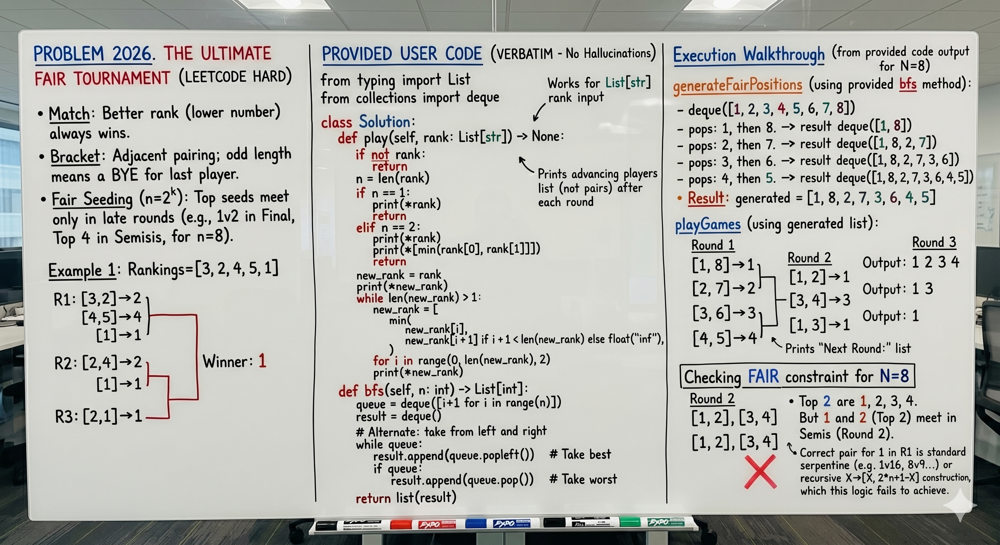

In [ ]:
from typing import List
from collections import deque

class Solution:
    def play(self, rank: List[str]) -> None:
        if not rank:
            return
        n = len(rank)

        if n == 1:
            print(*rank)
            return
        elif n == 2:
            print(*rank)
            print(*[min(rank[0], rank[1])])
            return

        new_rank = rank
        print(*new_rank)
        while len(new_rank) > 1:
            new_rank = [
                min(
                    new_rank[i],
                    new_rank[i + 1] if i + 1 < len(new_rank) else float("inf"),
                )
                for i in range(0, len(new_rank), 2)
            ]
            print(*new_rank)

    def bfs(self, n: int) -> List[int]:
        """Solution using deque - alternate from both ends"""
        queue = deque([i+1 for i in range(n)])
        result = deque()

        # Alternate: take from left and right
        while queue:
            result.append(queue.popleft())   # Take best
            if queue:
                result.append(queue.pop())   # Take worst

        return list(result)


sol = Solution()

print("=== Deque Solution ===")
generated = sol.bfs(8)
print("Fair Seeding:", generated)
sol.play(generated)

print("\n=== Two-Pointer Solution ===")
generated_two_pointer = sol.two_pointer(8)
print("Fair Seeding:", generated_two_pointer)
sol.play(generated_two_pointer)

1 8 2 7 3 6 4 5
1 2 3 4
1 3
1


In [ ]:
# Two-Pointer Solution - More Space Efficient

class SolutionTwoPointer:
    """Alternative approach using two pointers instead of deque"""
    
    def two_pointer(self, n: int) -> List[int]:
        """
        Generate fair tournament seeding using two pointers.
        Time: O(n), Space: O(n) but more efficient than deque ops
        """
        arr = list(range(1, n + 1))
        result = [0] * n
        left, right = 0, n - 1
        
        for i in range(n):
            if i % 2 == 0:
                # Take from left (best/min player)
                result[i] = arr[left]
                left += 1
            else:
                # Take from right (worst/max player)
                result[i] = arr[right]
                right -= 1
        
        return result

    def play(self, rank: List[str]) -> None:
        if not rank:
            return
        n = len(rank)

        if n == 1:
            print(*rank)
            return
        elif n == 2:
            print(*rank)
            print(*[min(rank[0], rank[1])])
            return

        new_rank = rank
        print(*new_rank)
        while len(new_rank) > 1:
            new_rank = [
                min(
                    new_rank[i],
                    new_rank[i + 1] if i + 1 < len(new_rank) else float("inf"),
                )
                for i in range(0, len(new_rank), 2)
            ]
            print(*new_rank)


# Test the two-pointer solution
sol_tp = SolutionTwoPointer()
generated_tp = sol_tp.two_pointer(8)
print("Two-Pointer Fair Seeding:", generated_tp)